A notebook to demonstrate the working of Proxial Policy Optimization. This is not yet optimized but just a simple demonstration to show the workign of the algorithm.

In [2]:
import gymnasium
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import random

# For reproducibility
seed = 42
np.random.seed(seed)
random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

In [3]:
class Actor(nn.Module):
    def __init__(self, state_dim, action_dim, hidden_dim=64):
        super(Actor, self).__init__()
        self.base = nn.Sequential(
            nn.Linear(state_dim, hidden_dim),
            nn.Tanh(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.Tanh(),
        )
        self.mean = nn.Linear(hidden_dim, action_dim)
        # We learn a log_std parameter (state-independent)
        self.log_std = nn.Parameter(torch.zeros(1, action_dim))
        
    def forward(self, state):
        x = self.base(state)
        mean = self.mean(x)
        std = torch.exp(self.log_std)
        return mean, std

In [4]:
class Critic(nn.Module):
    def __init__(self, state_dim, hidden_dim=64):
        super(Critic, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(state_dim, hidden_dim),
            nn.Tanh(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.Tanh(),
            nn.Linear(hidden_dim, 1)
        )
        
    def forward(self, state):
        return self.net(state)

In [5]:
class Memory:
    def __init__(self):
        self.states = []
        self.actions = []
        self.log_probs = []
        self.rewards = []
        self.dones = []
        self.next_states = []
        
    def clear(self):
        self.states = []
        self.actions = []
        self.log_probs = []
        self.rewards = []
        self.dones = []
        self.next_states = []

In [6]:
class PPOAgent:
    def __init__(self, state_dim, action_dim, hidden_dim=128, 
                 actor_lr=3e-4, critic_lr=1e-3, gamma=0.99, lam=0.95, 
                 eps_clip=0.2, K_epochs=10, batch_size=64, entropy_coef=0.05):
        self.actor = Actor(state_dim, action_dim, hidden_dim)
        self.critic = Critic(state_dim, hidden_dim)
        self.actor_optimizer = optim.Adam(self.actor.parameters(), lr=actor_lr)
        self.critic_optimizer = optim.Adam(self.critic.parameters(), lr=critic_lr)
        self.gamma = gamma
        self.lam = lam
        self.eps_clip = eps_clip
        self.K_epochs = K_epochs
        self.batch_size = batch_size
        self.entropy_coef = entropy_coef
        
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.actor.to(self.device)
        self.critic.to(self.device)
        
    def select_action(self, state):
        state_tensor = torch.FloatTensor(state).unsqueeze(0).to(self.device)
        mean, std = self.actor(state_tensor)
        dist = torch.distributions.Normal(mean, std)
        action = dist.sample()
        action = torch.clamp(action, -1.0, 1.0)
        log_prob = dist.log_prob(action).sum(dim=-1)
        return action.cpu().detach().numpy()[0], log_prob.cpu().detach().numpy()[0]
    
    def evaluate(self, states, actions):
        mean, std = self.actor(states)
        dist = torch.distributions.Normal(mean, std)
        log_probs = dist.log_prob(actions).sum(dim=-1, keepdim=True)
        entropy = dist.entropy().sum(dim=-1, keepdim=True)
        state_values = self.critic(states)
        return log_probs, state_values, entropy
    
    def compute_gae(self, memory, states):
        """
        Computes returns and advantages using Generalized Advantage Estimation (GAE).
        """
        rewards = memory.rewards
        dones = memory.dones
        # Compute state values for current and next states
        values = self.critic(states).detach().cpu().numpy().squeeze()
        next_states = torch.FloatTensor(np.array(memory.next_states)).to(self.device)
        next_values = self.critic(next_states).detach().cpu().numpy().squeeze()
        
        advantages = []
        gae = 0
        for i in reversed(range(len(rewards))):
            mask = 1 - dones[i]  # 0 if done, 1 otherwise
            delta = rewards[i] + self.gamma * next_values[i] * mask - values[i]
            gae = delta + self.gamma * self.lam * mask * gae
            advantages.insert(0, gae)
        returns = [adv + v for adv, v in zip(advantages, values)]
        return returns, advantages

    def update(self, memory):
        # Convert collected data to tensors
        states = torch.FloatTensor(np.array(memory.states)).to(self.device)
        actions = torch.FloatTensor(np.array(memory.actions)).to(self.device)
        old_log_probs = torch.FloatTensor(np.array(memory.log_probs)).to(self.device).unsqueeze(1)
        
        returns, advantages = self.compute_gae(memory, states)
        returns = torch.FloatTensor(returns).to(self.device).unsqueeze(1)
        advantages = torch.FloatTensor(advantages).to(self.device).unsqueeze(1)
        advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)
        
        dataset_size = states.size(0)
        for _ in range(self.K_epochs):
            for i in range(0, dataset_size, self.batch_size):
                end_i = i + self.batch_size
                batch_states = states[i:end_i]
                batch_actions = actions[i:end_i]
                batch_old_log_probs = old_log_probs[i:end_i]
                batch_returns = returns[i:end_i]
                batch_advantages = advantages[i:end_i]
                
                log_probs, state_values, entropy = self.evaluate(batch_states, batch_actions)
                ratios = torch.exp(log_probs - batch_old_log_probs)
                surr1 = ratios * batch_advantages
                surr2 = torch.clamp(ratios, 1 - self.eps_clip, 1 + self.eps_clip) * batch_advantages
                actor_loss = -torch.min(surr1, surr2).mean()
                critic_loss = nn.MSELoss()(state_values, batch_returns)
                loss = actor_loss + 0.5 * critic_loss - self.entropy_coef * entropy.mean()
                
                self.actor_optimizer.zero_grad()
                self.critic_optimizer.zero_grad()
                loss.backward()
                self.actor_optimizer.step()
                self.critic_optimizer.step()

In [7]:
env = gymnasium.make("MountainCarContinuous-v0", render_mode="rgb_array")
state_dim = env.observation_space.shape[0]
action_dim = env.action_space.shape[0]

agent = PPOAgent(
    state_dim, 
    action_dim, 
    hidden_dim=128,      # Increased from 64
    actor_lr=3e-4, 
    critic_lr=1e-3, 
    eps_clip=0.2, 
    K_epochs=10, 
    batch_size=64
)

memory = Memory()

In [8]:
num_episodes = 500     # Total episodes for training
max_timesteps = 1000   # Maximum timesteps per episode
update_timestep = 2048 # Update the policy every `update_timestep` steps
timestep = 0

episode_rewards = []

for episode in range(1, num_episodes+1):
    state, _ = env.reset()
    ep_reward = 0
    for t in range(max_timesteps):
        timestep += 1
        action, log_prob = agent.select_action(state)
        
        next_state, reward, terminated, truncated, _ = env.step(action)
        done = terminated or truncated
        
        # Store transition in memory
        memory.states.append(state)
        memory.actions.append(action)
        memory.log_probs.append(log_prob)
        memory.rewards.append(reward)
        memory.dones.append(done)
        memory.next_states.append(next_state)
        
        ep_reward += reward
        state = next_state
        
        # Update PPO agent when enough timesteps have been collected
        if timestep % update_timestep == 0:
            agent.update(memory)
            memory.clear()
        
        if done:
            break
            
    episode_rewards.append(ep_reward)
    if episode % 10 == 0:
        print(f"Episode {episode}\tReward: {ep_reward:.2f}")

env.close()

Episode 10	Reward: -49.40
Episode 20	Reward: -82.36
Episode 30	Reward: -80.35
Episode 40	Reward: -82.52
Episode 50	Reward: 35.31
Episode 60	Reward: -77.17
Episode 70	Reward: -68.16
Episode 80	Reward: -86.22
Episode 90	Reward: -80.48
Episode 100	Reward: -83.59
Episode 110	Reward: -83.54
Episode 120	Reward: -91.06
Episode 130	Reward: -79.19
Episode 140	Reward: -90.96
Episode 150	Reward: -80.75
Episode 160	Reward: -86.45
Episode 170	Reward: -89.81
Episode 180	Reward: 39.58
Episode 190	Reward: -98.07
Episode 200	Reward: -96.21
Episode 210	Reward: 9.14
Episode 220	Reward: -99.09
Episode 230	Reward: -97.82
Episode 240	Reward: -99.45
Episode 250	Reward: -99.70
Episode 260	Reward: -99.68
Episode 270	Reward: -99.79
Episode 280	Reward: -99.68
Episode 290	Reward: -99.71
Episode 300	Reward: -99.81
Episode 310	Reward: -99.84
Episode 320	Reward: -99.82
Episode 330	Reward: -99.89
Episode 340	Reward: -99.67
Episode 350	Reward: -99.50
Episode 360	Reward: -99.70
Episode 370	Reward: -95.47
Episode 380	Re

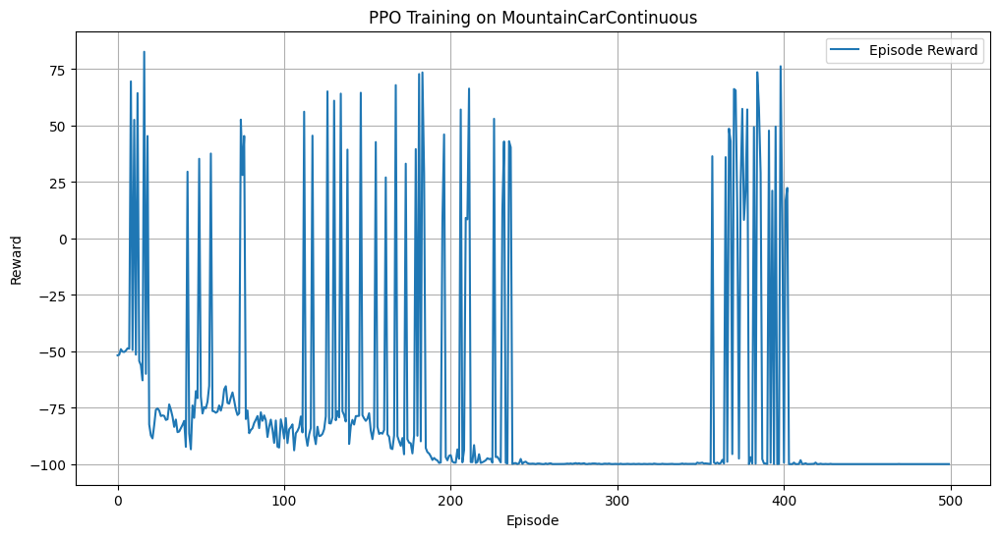

In [9]:
plt.figure(figsize=(12,6))
plt.plot(episode_rewards, label="Episode Reward")
plt.xlabel("Episode")
plt.ylabel("Reward")
plt.title("PPO Training on MountainCarContinuous")
plt.legend()
plt.grid(True)
plt.show()

In [10]:
# Create the environment with the desired render mode
# env = gymnasium.make("MountainCarContinuous-v0", render_mode="rgb_array")

state, _ = env.reset()
done = False
frames = []  # to store frames for animation

while not done:
    action, _ = agent.select_action(state)
    next_state, reward, terminated, truncated, _ = env.step(action)
    done = terminated or truncated
    frames.append(env.render())
    state = next_state

env.close()

# (Optional) Create an animation of the agent's performance
from matplotlib import animation
from IPython.display import HTML

fig, ax = plt.subplots()
im = ax.imshow(frames[0])
ax.axis('off')

def update(frame):
    im.set_array(frame)
    return [im]

ani = animation.FuncAnimation(fig, update, frames=frames, interval=50, blit=True)
plt.close()
HTML(ani.to_jshtml())
